## <font color="#CC6699"><center> Deniz Rasouli jambori 

## <font color="#CC6699"><center> Keyframes detection in cooking actions

## <font color="#CC0099"> keyframes detection based on the analysis of the state of the art
### <font color="#660066 ">The detection of keyframes is an important step in video analysis and summarization tasks. It entails determining which frames in a video sequence represent the most informative and representative content. Keyframes provide a concise summary of the video and can be used for a variety of purposes including video browsing, indexing, retrieval, and summarization.

### <font color="#660066 "> There are various approaches to keyframe detection, and the method chosen is determined by the specific requirements and characteristics of the video data. Here is an overview of some state-of-the-art keyframe detection methods:
    
### <font color="#CC6699">Frame Difference Method:
### <font color="#660066 ">  This method detects keyframes by calculating the difference between consecutive frames in a video sequence. Keyframes are defined as frames with a difference greater than a predefined threshold. This method is simple and efficient, but it may not be resistant to gradual changes in the scene or camera motion.

### <font color="#CC6699">Shot Boundary Detection:
### <font color="#660066 "> This technique identifies transitions between shots in a video, such as cuts, fades, or dissolves. Keyframes are frequently used as representative frames at the start or end of each shot. Color histograms, motion analysis, and other visual features can be used to detect shot boundaries.
    
### <font color="#CC6699">Methods Based on Clustering:
### <font color="#660066 ">These methods group frames based on their similarity and select representative frames from each cluster as keyframes. Color, texture, and motion are examples of visual features that can be clustered. Clustering techniques such as k-means, hierarchical clustering, and density-based clustering can be used.

### <font color="#CC6699">Methods Based on Content:
### <font color="#660066 ">Content-based keyframe detection identifies frames that contain significant visual content or semantic information. Object detection, scene recognition, face detection, and text extraction are examples of features that can be examined. For content-based keyframe detection, machine learning techniques, including deep learning-based models, can be used.
    
### <font color="#CC6699">Extraction of Keyframes Using SIFT or SURF:
### <font color="#660066 ">These methods detect distinct points in frames by leveraging local feature detection and matching algorithms such as Scale-Invariant Feature Transform (SIFT) or Speeded-Up Robust Features (SURF). The presence of a sufficient number of stable features or matching scores between frames is used to select keyframes.
    
### <font color="#660066 "> It's important to note that the keyframe detection method chosen is determined by the application's specific requirements, the nature of the video content, and the desired trade-off between efficiency and accuracy. To improve the effectiveness of keyframe detection, a combination of methods or a multi-stage approach is frequently used.

## <font color="#CC0099"> Dataset
    
### <font color="#660066">This dataset contains 15 videos obtained from 5 scenes from 3 different perspectives. Each video contains a series of cooking actions performed by a human while using various kitchen appliances.

### <font color="#660066">I preferred to use one consistent view from each video (I chose the top view).
 
### <font color="#660066">The number of actions varies from video to video (for example, one video may contain three actions to be detected as keyframes while another may contain six). 

### <font color="#660066">I attempted to detect not only the main action, but also a frame containing the process of acquiring the object required for that specific action prior to the main action.
    

## <font color="#CC0099"> Overall Pipeline
    

### <font color="#CC6699"> 1.Read the Input Video:
### <font color="#660066">The pipeline starts by reading the input video file using a video reader library. This provides a sequence of frames that will be processed for keyframe detection.

### <font color="#CC6699"> 2.Initialization:
### <font color="#660066"> Initialize variables and parameters required for the keyframe detection process. This includes setting the minimum interval between keyframes, the weight factor (a) for updating the reference image, and the change threshold for updating the reference image.

### <font color="#CC6699">3.Frame Comparison and Keyframe Detection:<br>
### <font color="#660066"> a. Read the first frame and convert it to grayscale.<br>
### <font color="#660066"> b. Initialize the reference image by calculating the average of multiple frames or using a single frame as the initial reference.<br>
### <font color="#660066"> c. Iterate through each frame of the video.<br>
### <font color="#660066">  d. Convert the current frame to grayscale.<br>
### <font color="#660066"> <font color="#660066"> e. Calculate the absolute difference between the current frame and the reference image.<br>
### <font color="#660066"> f. Convert the difference image to a binary image using a threshold.<br>
### <font color="#660066"> g. Count the number of white pixels in the binary image.<br>
### <font color="#660066"> h. If the number of white pixels exceeds a threshold, consider it a potential keyframe.<br>
### <font color="#660066"> i. Perform feature extraction using the SIFT algorithm on the current frame.<br>
### <font color="#660066"> j. Use a matcher to find matches between the current frame's descriptors and the previous keyframe's descriptors.<br>
### <font color="#660066"> k. If the number of matches exceeds a threshold and the min interval has passed, consider it a keyframe.<br>
### <font color="#660066"> l. Update the reference image if there is no change or the change is smaller than the threshold,<br>
### <font color="#660066">    using the formula: (1 - a) * previous reference image + a * current frame.<br>
### <font color="#660066"> m. Update variables and counters related to keyframe detection and intervals.<br>

### <font color="#CC6699">4.Save and Visualize Keyframes:
### <font color="#660066"> When a keyframe is detected, save the frame as an image and visualize it to provide visual feedback and verification of the keyframe detection process.<br> This can be achieved using image writing and visualization libraries such as OpenCV and matplotlib.

### <font color="#CC6699">5.Repeat Steps 3 and 4:
### <font color="#660066"> Repeat the frame comparison and keyframe detection process for each frame of the video until all frames have been processed.

### <font color="#CC6699"> 6.Return Keyframes:
###  <font color="#660066">Collect all detected keyframes and return them as a list or any desired data structure for further analysis or processing.

## <font color="#CC0099">Pipeline Selection and Advantages

### <font color="#660066">In this project, the keyframe detection pipeline is designed based on a comparison of consecutive frames using a difference threshold and feature matching techniques. This pipeline was chosen due to its effectiveness in identifying significant variations in video frames and its ability to adapt to dynamic content. The following factors influenced the selection of this pipeline:

### <font color="#CC6699">Change Detection: 
### <font color="#660066">The pipeline utilizes the absolute difference between frames to detect changes. This approach is suitable for identifying keyframes as it focuses on significant variations, enabling the extraction of frames that capture key actions or scenes within the video.

### <font color="#CC6699">Thresholding:
    
### <font color="#660066"> By applying a threshold to the frame difference, we can filter out small changes or noise, ensuring that only significant variations are considered as potential keyframes. This helps in reducing false positives and improving the accuracy of keyframe detection.

### <font color="#CC6699">Feature Matching: 
    
### <font color="#660066"> extraction. SIFT provides robust and distinctive features that can be matched between consecutive frames. By comparing the features, the pipeline assesses the similarity between frames and identifies potential keyframes based on a threshold for the number of matches. This approach is advantageous as it captures unique and representative frames that highlight important content within the video.

### <font color="#CC6699">Dynamic Reference Image:
### <font color="#660066"> One of the notable advantages of this pipeline is the inclusion of a dynamic reference image. The reference image is updated based on the detected changes in the frames. This adaptive approach allows the pipeline to adjust to variations in the video content, ensuring that the reference image accurately represents the scene. By updating the reference image, the pipeline can effectively capture keyframes that showcase essential actions or scenes within the video.

### <font color="#CC6699">Minimum Interval: 
 
### <font color="#660066">The pipeline incorporates a minimum interval parameter, which ensures that keyframes are detected at appropriate time intervals. This parameter helps in avoiding the detection of redundant or closely spaced keyframes, thus improving the efficiency of the pipeline and reducing visual redundancy in the final set of keyframes.

### <font color="#660066">By combining these techniques, the chosen pipeline offers a robust and adaptable solution for keyframe detection in videos. It leverages change detection, thresholding, feature matching, and dynamic reference image updating to accurately identify and extract keyframes that highlight important content and actions within the video.

## <font color="#CC0099"> Initial approach 
    
### <font color="#660066"> The above algorithm is the final version of the method I customized to detect keyframes within the cooking action dataset videos. However, the initial and brute force method that I used is explained below in order to understand its shortcomings and the quality of the results in comparison to the final version. So it's a good idea to start with the first approach and see how it works, as well as which parts have been changed in the latest version to address the issues that I'm encountering within this very first algorithm.
    
    
### <font color="#CC6699"> Over all Pipeline for the brute force method:
#### <font color="#660066"> 1. Open the video file.
#### <font color="#660066"> 2. Initialize necessary variables and objects.
#### <font color="#660066"> 3. Read the first frame and convert it to grayscale.
#### <font color="#660066"> 4. Loop through each frame in the video.
#### <font color="#660066"> 5. Convert the current frame to grayscale.
#### <font color="#660066"> 6. Calculate the absolute difference between the current and previous frames.
#### <font color="#660066"> 7. Threshold the difference image to obtain a binary image.
#### <font color="#660066"> 8. Count the number of white pixels in the thresholded image.
#### <font color="#660066"> 9. Perform feature extraction using ORB on the previous and current frames.
#### <font color="#660066"> 10. Match the descriptors of the previous and current frames.
#### <font color="#660066"> 11. If the number of white pixels or the number of matches exceeds certain thresholds, consider it a keyframe.
#### <font color="#660066"> 12. Save the keyframe as an image and add it to the keyframes list.
#### <font color="#660066"> 13. Visualize the keyframe.
#### <font color="#660066"> 14. Update the previous frame and frame count.
#### <font color="#660066"> 15. Release the video capture and return the keyframes list.
    

### <font color="#660066"> The implementation section follows, and I will only use the first video of the cooking action data to analyze the result and determine the problems that need to be fixed (and we will see that these problems no longer occur in the final version of the adapted method).

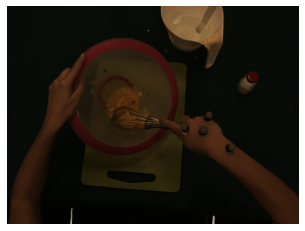

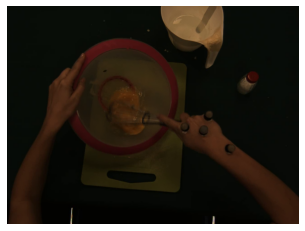

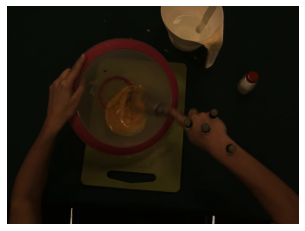

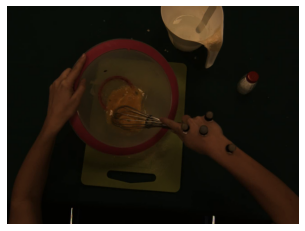

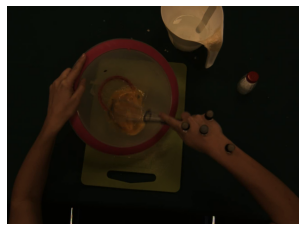

...

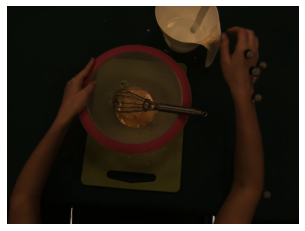

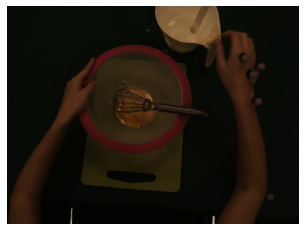

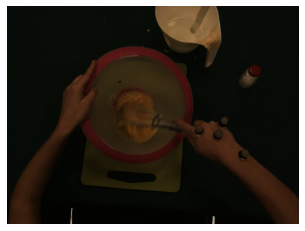

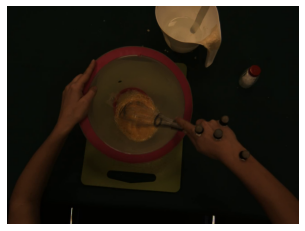

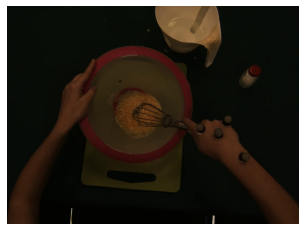

In [3]:
import cv2
import matplotlib.pyplot as plt

def extract_keyframes(video_path):
    cap = cv2.VideoCapture(video_path)
    frames = []
    
    # Create ORB object
    orb = cv2.ORB_create()
    
    # Read the first frame
    ret, prev_frame = cap.read()
    if not ret:
        return frames
    
    # Convert frame to grayscale
    prev_frame_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)
    
    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
        
        # Convert frame to grayscale
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        
        # Calculate the absolute difference between frames
        frame_diff = cv2.absdiff(frame_gray, prev_frame_gray)
        
        # Threshold the difference image
        _, thresh = cv2.threshold(frame_diff, 150, 255, cv2.THRESH_BINARY)
        
        # Count the number of white pixels in the thresholded image
        white_pixels = cv2.countNonZero(thresh)
        
        # Perform feature extraction using ORB
        kp_prev, des_prev = orb.detectAndCompute(prev_frame_gray, None)
        kp_curr, des_curr = orb.detectAndCompute(frame_gray, None)
        
        # Use a matcher to find matches between the previous and current frame descriptors
        matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_BRUTEFORCE_HAMMING)
        matches = matcher.match(des_prev, des_curr)
        
        # If the number of white pixels or the number of matches exceeds a threshold, consider it a keyframe
        if white_pixels > 0 and len(matches) > 8:  # Adjust the thresholds as needed
            frames.append(frame)
            cv2.imwrite(f"keyframe_{frame_count}.jpg", frame)  # Save the keyframe as an image
            
            # Visualize the keyframe
            plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            plt.axis('off')
            plt.show()
        
        # Update previous frame
        prev_frame_gray = frame_gray
        frame_count += 1
    
    cap.release()
    return frames

# Example usage
video_path = r"C:\Users\Pishro System\Downloads\SCENE1_1.avi"

keyframes = extract_keyframes(video_path)



## <font color="#CC0099"> Analysis of the results
### <font color="#660066">  As you can see, the number of keyframes detected is excessive. We use keyframe detection to summarize the video, but if we get a lot of keyframes, it means that a lot of them are redundant.  As a result, the algorithm detects more than one keyframe for each main action. We need to modify the algorithm so that it can detect one or no more than two frames per cooking action. 
### <font color="#660066">Furthermore, each frame is compared to its preceding frame, which is a rash and ineffective approach. The best way, in my opinion, is to compare the current frame with a reference frame and update this reference image based on the amount of changes in the scene.

### <font color="#660066">Another change concerns the minimum interval between two detected keyframes that the algorithm should consider.This parameter aids in the detection of redundant or closely spaced keyframes, improving pipeline efficiency and reducing visual redundancy in the final set of keyframes.
    


## <font color="#CC0099"> Analysis of the final method results

## <font color="#CC0099">Input: First video containing seven keyframes from seven main actions


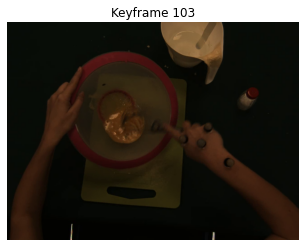

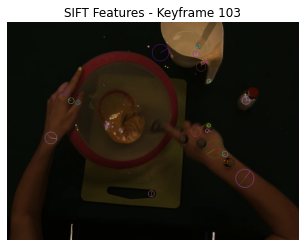

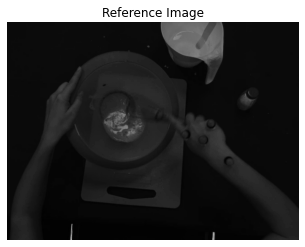

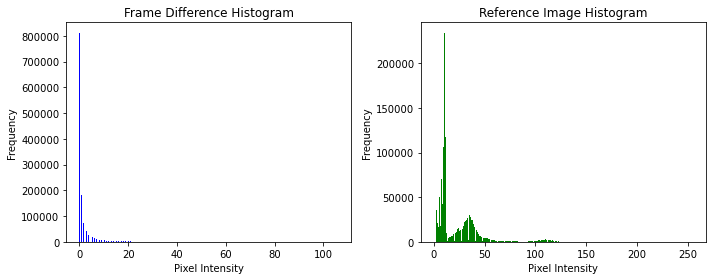

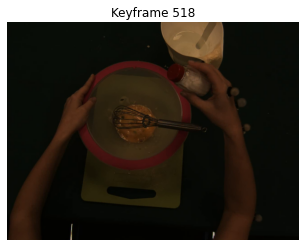

...

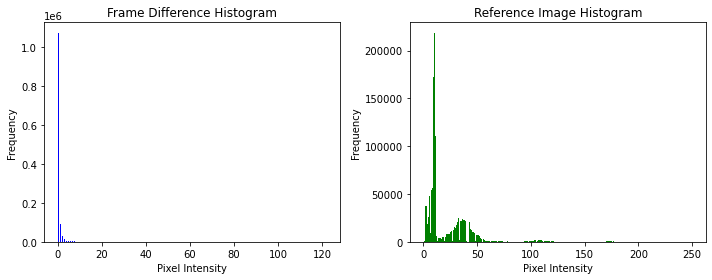

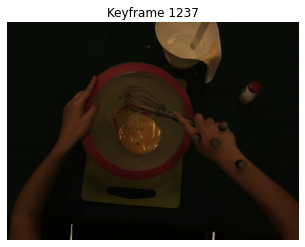

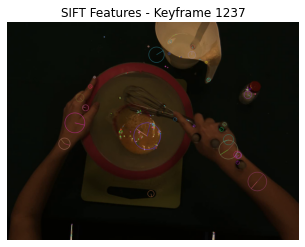

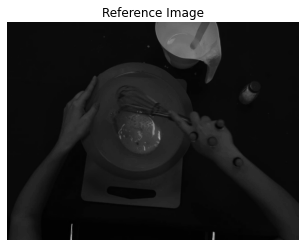

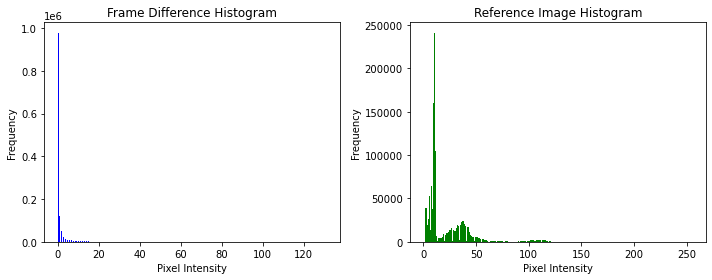

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def calculate_similarity(frame1, frame2):
    # Create SIFT object
    sift = cv2.SIFT_create()

    # Convert frames to grayscale
    frame1_gray = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
    frame2_gray = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

    # Perform feature extraction using SIFT
    kp1, des1 = sift.detectAndCompute(frame1_gray, None)
    kp2, des2 = sift.detectAndCompute(frame2_gray, None)

    # Use a matcher to find matches between the descriptors of two frames
    matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
    matches = matcher.match(des1, des2)

    # Calculate the average distance of the matches
    avg_distance = sum(match.distance for match in matches) / len(matches)

    return avg_distance

def extract_keyframes(video_path, min_interval, a=0.2, change_threshold=10):
    cap = cv2.VideoCapture(video_path)
    frames = []

    # Create SIFT object
    sift = cv2.SIFT_create()

    # Read the first frame
    ret, prev_frame = cap.read()
    if not ret:
        return frames

    # Convert frame to grayscale
    prev_frame_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

    frame_count = 0
    action_start_frame = 0
    action_duration = 0
    is_keyframe_detected = False
    frames_since_last_keyframe = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Convert frame to grayscale
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Calculate the absolute difference between frames
        frame_diff = cv2.absdiff(frame_gray, prev_frame_gray)

        # Threshold the difference image
        _, thresh = cv2.threshold(frame_diff, 95, 255, cv2.THRESH_BINARY)

        # Count the number of white pixels in the thresholded image
        white_pixels = cv2.countNonZero(thresh)

        # If the number of white pixels exceeds a threshold, consider it a potential keyframe
        if white_pixels > 40:

            # Perform feature extraction using SIFT
            kp_curr, des_curr = sift.detectAndCompute(frame_gray, None)

            # Use a matcher to find matches between the current frame descriptors and previous keyframe descriptors
            matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
            if len(frames) > 0:
                des_prev = frames[-1][1]
                matches = matcher.match(des_prev, des_curr)

                # If the number of matches exceeds a threshold, and the min interval has passed, consider it a keyframe
                if len(matches) > 10 and not is_keyframe_detected and frames_since_last_keyframe >= min_interval:
                    frames.append((frame, des_curr))
                    cv2.imwrite(f"keyframe_{frame_count}.jpg", frame)  # Save the keyframe as an image

                    # Visualize the keyframe with label
                    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                    plt.title(f'Keyframe {frame_count}')
                    plt.axis('off')
                    plt.show()

                    # Visualize the SIFT features with labels
                    img_kp = cv2.drawKeypoints(frame, kp_curr, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
                    plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
                    plt.title(f'SIFT Features - Keyframe {frame_count}')
                    plt.axis('off')
                    plt.show()

                    # Visualize the reference image
                    plt.imshow(prev_frame_gray, cmap='gray')
                    plt.title('Reference Image')
                    plt.axis('off')
                    plt.show()

                    # Calculate histograms
                    fig, axs = plt.subplots(1, 2, figsize=(10, 4))

                    # Plot frame difference histogram
                    axs[0].hist(frame_diff.ravel(), bins=256, color='blue')
                    axs[0].set_title('Frame Difference Histogram')
                    axs[0].set_xlabel('Pixel Intensity')
                    axs[0].set_ylabel('Frequency')

                    # Plot reference frame histogram
                    axs[1].hist(prev_frame_gray.ravel(), bins=256, color='green')
                    axs[1].set_title('Reference Image Histogram')
                    axs[1].set_xlabel('Pixel Intensity')
                    axs[1].set_ylabel('Frequency')

                    plt.tight_layout()
                    plt.show()

                    is_keyframe_detected = True
                    frames_since_last_keyframe = 0

            else:
                # If it's the first frame, consider it a keyframe
                frames.append((frame, des_curr))
                cv2.imwrite(f"keyframe_{frame_count}.jpg", frame)  # Save the keyframe as an image

                # Visualize the keyframe with label
                plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                plt.title(f'Keyframe {frame_count}')
                plt.axis('off')
                plt.show()

                # Visualize the SIFT features with labels
                img_kp = cv2.drawKeypoints(frame, kp_curr, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
                plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
                plt.title(f'SIFT Features - Keyframe {frame_count}')
                plt.axis('off')
                plt.show()

                # Visualize the reference image
                plt.imshow(prev_frame_gray, cmap='gray')
                plt.title('Reference Image')
                plt.axis('off')
                plt.show()

                # Calculate histograms
                fig, axs = plt.subplots(1, 2, figsize=(10, 4))

                # Plot frame difference histogram
                axs[0].hist(frame_diff.ravel(), bins=256, color='blue')
                axs[0].set_title('Frame Difference Histogram')
                axs[0].set_xlabel('Pixel Intensity')
                axs[0].set_ylabel('Frequency')

                # Plot reference frame histogram
                axs[1].hist(prev_frame_gray.ravel(), bins=256, color='green')
                axs[1].set_title('Reference Image Histogram')
                axs[1].set_xlabel('Pixel Intensity')
                axs[1].set_ylabel('Frequency')

                plt.tight_layout()
                plt.show()

                is_keyframe_detected = True
                frames_since_last_keyframe = 0

        # Update the reference image if there is no change or change is smaller than the threshold
        if np.sum(frame_diff) < change_threshold:
            ref_frame = (1 - a) * prev_frame_gray.astype(float) + a * frame_gray.astype(float)
            ref_frame = ref_frame.astype(np.uint8)
        else:
            ref_frame = frame_gray

        # Update action duration and keyframe detection status
        if is_keyframe_detected:
            action_duration = 0
            is_keyframe_detected = False
        else:
            action_duration += 1

        # Check if the action duration is longer than the desired threshold
        if action_duration > 15:  # Adjust the threshold as needed
            action_duration = 0

        # Update frames since the last keyframe
        frames_since_last_keyframe += 1

        # Update previous frame and frame count
        prev_frame_gray = frame_gray
        frame_count += 1

    cap.release()
    return frames

# Example usage
video_path = r"C:\Users\Pishro System\Downloads\SCENE1_1.avi"

keyframes = extract_keyframes(video_path, min_interval=130)


## <font color="#660066"> As you can see we have different elements in the output of our implementation.
### <font color="#660066"> 1. The keyframe that is identified and labeled with its frame number.
### <font color="#660066"> 2. SIFT characteristics of the discovered keyframe. It simultaneously includes the features' magnitude and direction. This made it easier for us to recognize the areas of the image that were of greater interest during the feature detection and comparison process. and which areas of the image have the greatest degree of change (since SIFT features are gradients that depict changes in illumination, etc.).

### <font color="#660066"> 3. The reference image at the moment the frame was detected. This demonstrates how the final output keyframe was chosen based on the background reference.
### <font color="#660066"> 4. Two histograms, one showing the difference between the reference image and the keyframe that was detected, and the other the histogram of the reference image itself.

### <font color="#660066"> As you can see below, the algorithm correctly identified every keyframe with the least amount of redundant output after I changed the input video four times.

## <font color="#CC0099">Input: Second video containing five keyframes

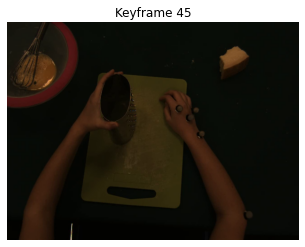

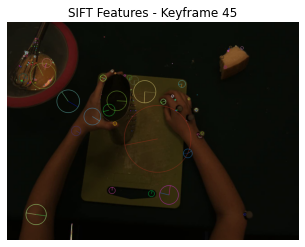

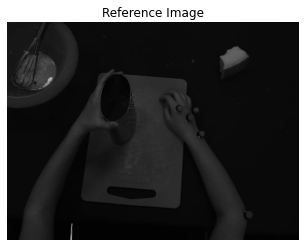

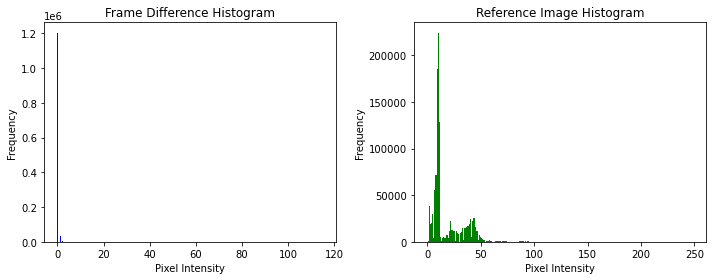

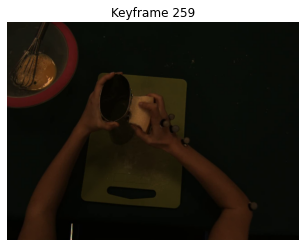

...

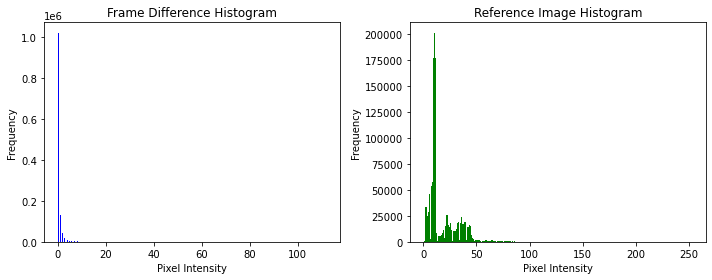

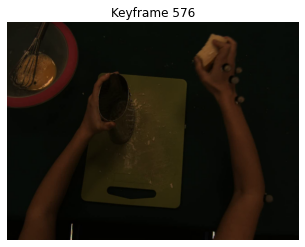

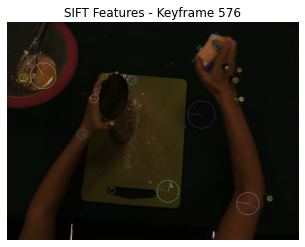

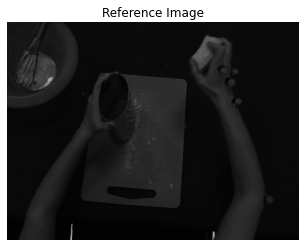

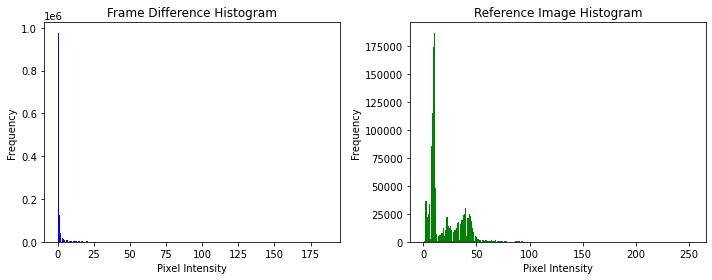

In [10]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def calculate_similarity(frame1, frame2):
    # Create SIFT object
    sift = cv2.SIFT_create()

    # Convert frames to grayscale
    frame1_gray = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
    frame2_gray = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

    # Perform feature extraction using SIFT
    kp1, des1 = sift.detectAndCompute(frame1_gray, None)
    kp2, des2 = sift.detectAndCompute(frame2_gray, None)

    # Use a matcher to find matches between the descriptors of two frames
    matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
    matches = matcher.match(des1, des2)

    # Calculate the average distance of the matches
    avg_distance = sum(match.distance for match in matches) / len(matches)

    return avg_distance

def extract_keyframes(video_path, min_interval, a=0.2, change_threshold=10):
    cap = cv2.VideoCapture(video_path)
    frames = []

    # Create SIFT object
    sift = cv2.SIFT_create()

    # Read the first frame
    ret, prev_frame = cap.read()
    if not ret:
        return frames

    # Convert frame to grayscale
    prev_frame_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

    frame_count = 0
    action_start_frame = 0
    action_duration = 0
    is_keyframe_detected = False
    frames_since_last_keyframe = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Convert frame to grayscale
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Calculate the absolute difference between frames
        frame_diff = cv2.absdiff(frame_gray, prev_frame_gray)

        # Threshold the difference image
        _, thresh = cv2.threshold(frame_diff, 95, 255, cv2.THRESH_BINARY)

        # Count the number of white pixels in the thresholded image
        white_pixels = cv2.countNonZero(thresh)

        # If the number of white pixels exceeds a threshold, consider it a potential keyframe
        if white_pixels > 40:

            # Perform feature extraction using SIFT
            kp_curr, des_curr = sift.detectAndCompute(frame_gray, None)

            # Use a matcher to find matches between the current frame descriptors and previous keyframe descriptors
            matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
            if len(frames) > 0:
                des_prev = frames[-1][1]
                matches = matcher.match(des_prev, des_curr)

                # If the number of matches exceeds a threshold, and the min interval has passed, consider it a keyframe
                if len(matches) > 10 and not is_keyframe_detected and frames_since_last_keyframe >= min_interval:
                    frames.append((frame, des_curr))
                    cv2.imwrite(f"keyframe_{frame_count}.jpg", frame)  # Save the keyframe as an image

                    # Visualize the keyframe with label
                    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                    plt.title(f'Keyframe {frame_count}')
                    plt.axis('off')
                    plt.show()

                    # Visualize the SIFT features with labels
                    img_kp = cv2.drawKeypoints(frame, kp_curr, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
                    plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
                    plt.title(f'SIFT Features - Keyframe {frame_count}')
                    plt.axis('off')
                    plt.show()

                    # Visualize the reference image
                    plt.imshow(prev_frame_gray, cmap='gray')
                    plt.title('Reference Image')
                    plt.axis('off')
                    plt.show()

                    # Calculate histograms
                    fig, axs = plt.subplots(1, 2, figsize=(10, 4))

                    # Plot frame difference histogram
                    axs[0].hist(frame_diff.ravel(), bins=256, color='blue')
                    axs[0].set_title('Frame Difference Histogram')
                    axs[0].set_xlabel('Pixel Intensity')
                    axs[0].set_ylabel('Frequency')

                    # Plot reference frame histogram
                    axs[1].hist(prev_frame_gray.ravel(), bins=256, color='green')
                    axs[1].set_title('Reference Image Histogram')
                    axs[1].set_xlabel('Pixel Intensity')
                    axs[1].set_ylabel('Frequency')

                    plt.tight_layout()
                    plt.show()

                    is_keyframe_detected = True
                    frames_since_last_keyframe = 0

            else:
                # If it's the first frame, consider it a keyframe
                frames.append((frame, des_curr))
                cv2.imwrite(f"keyframe_{frame_count}.jpg", frame)  # Save the keyframe as an image

                # Visualize the keyframe with label
                plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                plt.title(f'Keyframe {frame_count}')
                plt.axis('off')
                plt.show()

                # Visualize the SIFT features with labels
                img_kp = cv2.drawKeypoints(frame, kp_curr, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
                plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
                plt.title(f'SIFT Features - Keyframe {frame_count}')
                plt.axis('off')
                plt.show()

                # Visualize the reference image
                plt.imshow(prev_frame_gray, cmap='gray')
                plt.title('Reference Image')
                plt.axis('off')
                plt.show()

                # Calculate histograms
                fig, axs = plt.subplots(1, 2, figsize=(10, 4))

                # Plot frame difference histogram
                axs[0].hist(frame_diff.ravel(), bins=256, color='blue')
                axs[0].set_title('Frame Difference Histogram')
                axs[0].set_xlabel('Pixel Intensity')
                axs[0].set_ylabel('Frequency')

                # Plot reference frame histogram
                axs[1].hist(prev_frame_gray.ravel(), bins=256, color='green')
                axs[1].set_title('Reference Image Histogram')
                axs[1].set_xlabel('Pixel Intensity')
                axs[1].set_ylabel('Frequency')

                plt.tight_layout()
                plt.show()

                is_keyframe_detected = True
                frames_since_last_keyframe = 0

        # Update the reference image if there is no change or change is smaller than the threshold
        if np.sum(frame_diff) < change_threshold:
            ref_frame = (1 - a) * prev_frame_gray.astype(float) + a * frame_gray.astype(float)
            ref_frame = ref_frame.astype(np.uint8)
        else:
            ref_frame = frame_gray

        # Update action duration and keyframe detection status
        if is_keyframe_detected:
            action_duration = 0
            is_keyframe_detected = False
        else:
            action_duration += 1

        # Check if the action duration is longer than the desired threshold
        if action_duration > 15:  # Adjust the threshold as needed
            action_duration = 0

        # Update frames since the last keyframe
        frames_since_last_keyframe += 1

        # Update previous frame and frame count
        prev_frame_gray = frame_gray
        frame_count += 1

    cap.release()
    return frames

# Example usage
video_path = r"C:\Users\Pishro System\Downloads\SCENE2_1.avi"

keyframes = extract_keyframes(video_path, min_interval=100)


## <font color="#CC0099">Input: Third video containing seven keyframes

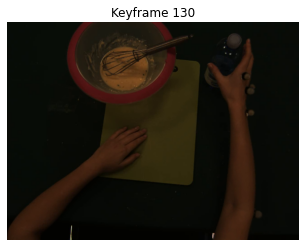

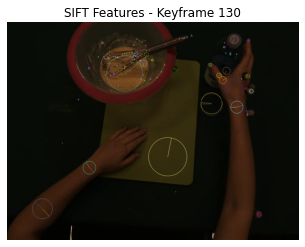

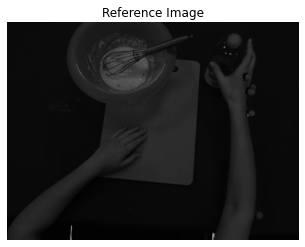

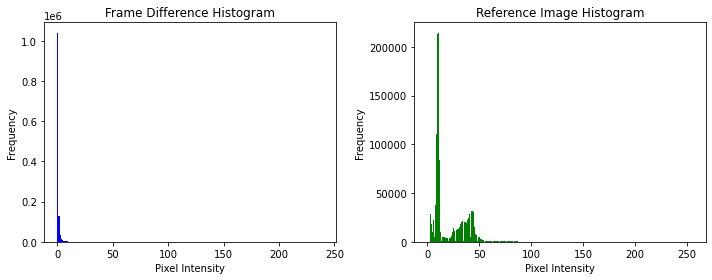

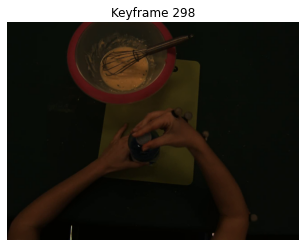

...

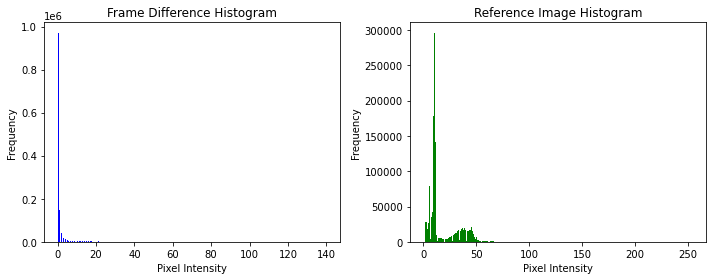

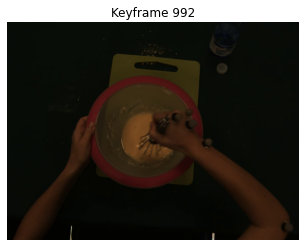

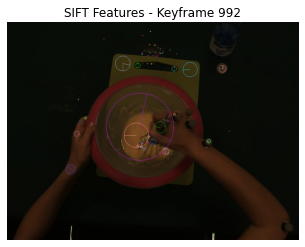

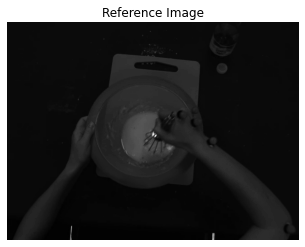

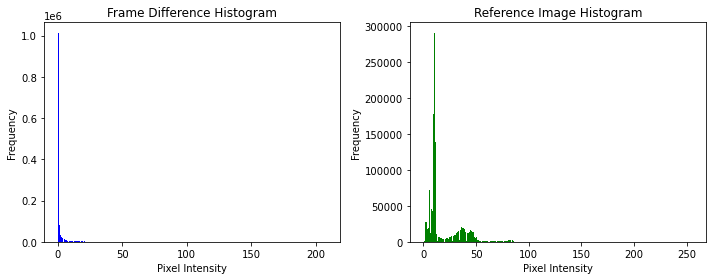

In [19]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def calculate_similarity(frame1, frame2):
    # Create SIFT object
    sift = cv2.SIFT_create()

    # Convert frames to grayscale
    frame1_gray = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
    frame2_gray = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

    # Perform feature extraction using SIFT
    kp1, des1 = sift.detectAndCompute(frame1_gray, None)
    kp2, des2 = sift.detectAndCompute(frame2_gray, None)

    # Use a matcher to find matches between the descriptors of two frames
    matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
    matches = matcher.match(des1, des2)

    # Calculate the average distance of the matches
    avg_distance = sum(match.distance for match in matches) / len(matches)

    return avg_distance

def extract_keyframes(video_path, min_interval, a=0.2, change_threshold=10):
    cap = cv2.VideoCapture(video_path)
    frames = []

    # Create SIFT object
    sift = cv2.SIFT_create()

    # Read the first frame
    ret, prev_frame = cap.read()
    if not ret:
        return frames

    # Convert frame to grayscale
    prev_frame_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

    frame_count = 0
    action_start_frame = 0
    action_duration = 0
    is_keyframe_detected = False
    frames_since_last_keyframe = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Convert frame to grayscale
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Calculate the absolute difference between frames
        frame_diff = cv2.absdiff(frame_gray, prev_frame_gray)

        # Threshold the difference image
        _, thresh = cv2.threshold(frame_diff, 95, 255, cv2.THRESH_BINARY)

        # Count the number of white pixels in the thresholded image
        white_pixels = cv2.countNonZero(thresh)

        # If the number of white pixels exceeds a threshold, consider it a potential keyframe
        if white_pixels > 40:

            # Perform feature extraction using SIFT
            kp_curr, des_curr = sift.detectAndCompute(frame_gray, None)

            # Use a matcher to find matches between the current frame descriptors and previous keyframe descriptors
            matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
            if len(frames) > 0:
                des_prev = frames[-1][1]
                matches = matcher.match(des_prev, des_curr)

                # If the number of matches exceeds a threshold, and the min interval has passed, consider it a keyframe
                if len(matches) > 10 and not is_keyframe_detected and frames_since_last_keyframe >= min_interval:
                    frames.append((frame, des_curr))
                    cv2.imwrite(f"keyframe_{frame_count}.jpg", frame)  # Save the keyframe as an image

                    # Visualize the keyframe with label
                    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                    plt.title(f'Keyframe {frame_count}')
                    plt.axis('off')
                    plt.show()

                    # Visualize the SIFT features with labels
                    img_kp = cv2.drawKeypoints(frame, kp_curr, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
                    plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
                    plt.title(f'SIFT Features - Keyframe {frame_count}')
                    plt.axis('off')
                    plt.show()

                    # Visualize the reference image
                    plt.imshow(prev_frame_gray, cmap='gray')
                    plt.title('Reference Image')
                    plt.axis('off')
                    plt.show()

                    # Calculate histograms
                    fig, axs = plt.subplots(1, 2, figsize=(10, 4))

                    # Plot frame difference histogram
                    axs[0].hist(frame_diff.ravel(), bins=256, color='blue')
                    axs[0].set_title('Frame Difference Histogram')
                    axs[0].set_xlabel('Pixel Intensity')
                    axs[0].set_ylabel('Frequency')

                    # Plot reference frame histogram
                    axs[1].hist(prev_frame_gray.ravel(), bins=256, color='green')
                    axs[1].set_title('Reference Image Histogram')
                    axs[1].set_xlabel('Pixel Intensity')
                    axs[1].set_ylabel('Frequency')

                    plt.tight_layout()
                    plt.show()

                    is_keyframe_detected = True
                    frames_since_last_keyframe = 0

            else:
                # If it's the first frame, consider it a keyframe
                frames.append((frame, des_curr))
                cv2.imwrite(f"keyframe_{frame_count}.jpg", frame)  # Save the keyframe as an image

                # Visualize the keyframe with label
                plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                plt.title(f'Keyframe {frame_count}')
                plt.axis('off')
                plt.show()

                # Visualize the SIFT features with labels
                img_kp = cv2.drawKeypoints(frame, kp_curr, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
                plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
                plt.title(f'SIFT Features - Keyframe {frame_count}')
                plt.axis('off')
                plt.show()

                # Visualize the reference image
                plt.imshow(prev_frame_gray, cmap='gray')
                plt.title('Reference Image')
                plt.axis('off')
                plt.show()

                # Calculate histograms
                fig, axs = plt.subplots(1, 2, figsize=(10, 4))

                # Plot frame difference histogram
                axs[0].hist(frame_diff.ravel(), bins=256, color='blue')
                axs[0].set_title('Frame Difference Histogram')
                axs[0].set_xlabel('Pixel Intensity')
                axs[0].set_ylabel('Frequency')

                # Plot reference frame histogram
                axs[1].hist(prev_frame_gray.ravel(), bins=256, color='green')
                axs[1].set_title('Reference Image Histogram')
                axs[1].set_xlabel('Pixel Intensity')
                axs[1].set_ylabel('Frequency')

                plt.tight_layout()
                plt.show()

                is_keyframe_detected = True
                frames_since_last_keyframe = 0

        # Update the reference image if there is no change or change is smaller than the threshold
        if np.sum(frame_diff) < change_threshold:
            ref_frame = (1 - a) * prev_frame_gray.astype(float) + a * frame_gray.astype(float)
            ref_frame = ref_frame.astype(np.uint8)
        else:
            ref_frame = frame_gray

        # Update action duration and keyframe detection status
        if is_keyframe_detected:
            action_duration = 0
            is_keyframe_detected = False
        else:
            action_duration += 1

        # Check if the action duration is longer than the desired threshold
        if action_duration > 15:  # Adjust the threshold as needed
            action_duration = 0

        # Update frames since the last keyframe
        frames_since_last_keyframe += 1

        # Update previous frame and frame count
        prev_frame_gray = frame_gray
        frame_count += 1

    cap.release()
    return frames

# Example usage
video_path = r"C:\Users\Pishro System\Downloads\SCENE3_1.avi"

keyframes = extract_keyframes(video_path, min_interval=130)


## <font color="#CC0099">Input:Fourth video containing twelve keyframes

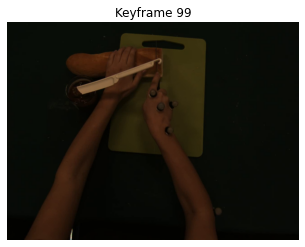

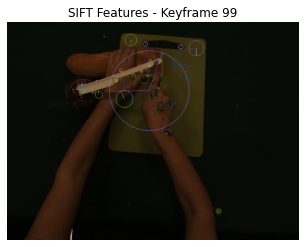

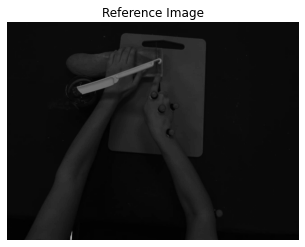

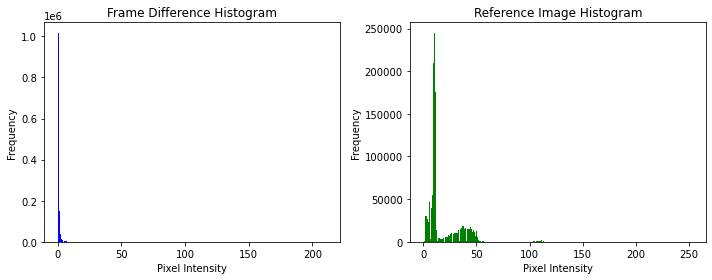

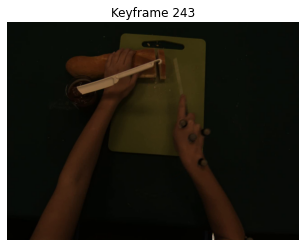

...

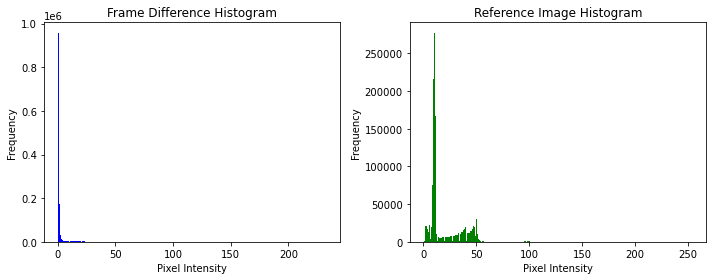

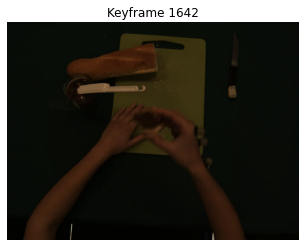

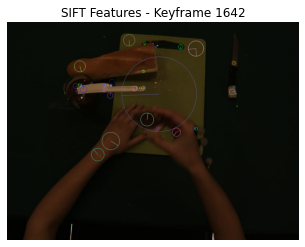

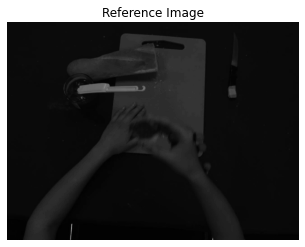

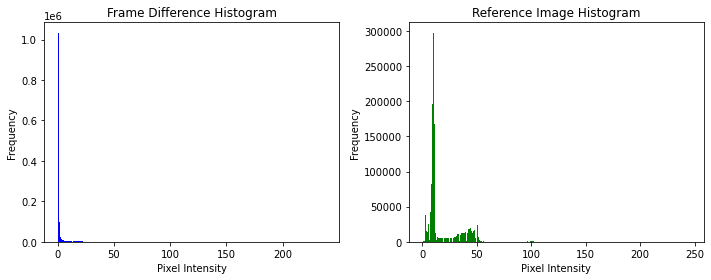

In [20]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def calculate_similarity(frame1, frame2):
    # Create SIFT object
    sift = cv2.SIFT_create()

    # Convert frames to grayscale
    frame1_gray = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
    frame2_gray = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

    # Perform feature extraction using SIFT
    kp1, des1 = sift.detectAndCompute(frame1_gray, None)
    kp2, des2 = sift.detectAndCompute(frame2_gray, None)

    # Use a matcher to find matches between the descriptors of two frames
    matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
    matches = matcher.match(des1, des2)

    # Calculate the average distance of the matches
    avg_distance = sum(match.distance for match in matches) / len(matches)

    return avg_distance

def extract_keyframes(video_path, min_interval, a=0.2, change_threshold=10):
    cap = cv2.VideoCapture(video_path)
    frames = []

    # Create SIFT object
    sift = cv2.SIFT_create()

    # Read the first frame
    ret, prev_frame = cap.read()
    if not ret:
        return frames

    # Convert frame to grayscale
    prev_frame_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

    frame_count = 0
    action_start_frame = 0
    action_duration = 0
    is_keyframe_detected = False
    frames_since_last_keyframe = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Convert frame to grayscale
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Calculate the absolute difference between frames
        frame_diff = cv2.absdiff(frame_gray, prev_frame_gray)

        # Threshold the difference image
        _, thresh = cv2.threshold(frame_diff, 95, 255, cv2.THRESH_BINARY)

        # Count the number of white pixels in the thresholded image
        white_pixels = cv2.countNonZero(thresh)

        # If the number of white pixels exceeds a threshold, consider it a potential keyframe
        if white_pixels > 40:

            # Perform feature extraction using SIFT
            kp_curr, des_curr = sift.detectAndCompute(frame_gray, None)

            # Use a matcher to find matches between the current frame descriptors and previous keyframe descriptors
            matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
            if len(frames) > 0:
                des_prev = frames[-1][1]
                matches = matcher.match(des_prev, des_curr)

                # If the number of matches exceeds a threshold, and the min interval has passed, consider it a keyframe
                if len(matches) > 10 and not is_keyframe_detected and frames_since_last_keyframe >= min_interval:
                    frames.append((frame, des_curr))
                    cv2.imwrite(f"keyframe_{frame_count}.jpg", frame)  # Save the keyframe as an image

                    # Visualize the keyframe with label
                    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                    plt.title(f'Keyframe {frame_count}')
                    plt.axis('off')
                    plt.show()

                    # Visualize the SIFT features with labels
                    img_kp = cv2.drawKeypoints(frame, kp_curr, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
                    plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
                    plt.title(f'SIFT Features - Keyframe {frame_count}')
                    plt.axis('off')
                    plt.show()

                    # Visualize the reference image
                    plt.imshow(prev_frame_gray, cmap='gray')
                    plt.title('Reference Image')
                    plt.axis('off')
                    plt.show()

                    # Calculate histograms
                    fig, axs = plt.subplots(1, 2, figsize=(10, 4))

                    # Plot frame difference histogram
                    axs[0].hist(frame_diff.ravel(), bins=256, color='blue')
                    axs[0].set_title('Frame Difference Histogram')
                    axs[0].set_xlabel('Pixel Intensity')
                    axs[0].set_ylabel('Frequency')

                    # Plot reference frame histogram
                    axs[1].hist(prev_frame_gray.ravel(), bins=256, color='green')
                    axs[1].set_title('Reference Image Histogram')
                    axs[1].set_xlabel('Pixel Intensity')
                    axs[1].set_ylabel('Frequency')

                    plt.tight_layout()
                    plt.show()

                    is_keyframe_detected = True
                    frames_since_last_keyframe = 0

            else:
                # If it's the first frame, consider it a keyframe
                frames.append((frame, des_curr))
                cv2.imwrite(f"keyframe_{frame_count}.jpg", frame)  # Save the keyframe as an image

                # Visualize the keyframe with label
                plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                plt.title(f'Keyframe {frame_count}')
                plt.axis('off')
                plt.show()

                # Visualize the SIFT features with labels
                img_kp = cv2.drawKeypoints(frame, kp_curr, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
                plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
                plt.title(f'SIFT Features - Keyframe {frame_count}')
                plt.axis('off')
                plt.show()

                # Visualize the reference image
                plt.imshow(prev_frame_gray, cmap='gray')
                plt.title('Reference Image')
                plt.axis('off')
                plt.show()

                # Calculate histograms
                fig, axs = plt.subplots(1, 2, figsize=(10, 4))

                # Plot frame difference histogram
                axs[0].hist(frame_diff.ravel(), bins=256, color='blue')
                axs[0].set_title('Frame Difference Histogram')
                axs[0].set_xlabel('Pixel Intensity')
                axs[0].set_ylabel('Frequency')

                # Plot reference frame histogram
                axs[1].hist(prev_frame_gray.ravel(), bins=256, color='green')
                axs[1].set_title('Reference Image Histogram')
                axs[1].set_xlabel('Pixel Intensity')
                axs[1].set_ylabel('Frequency')

                plt.tight_layout()
                plt.show()

                is_keyframe_detected = True
                frames_since_last_keyframe = 0

        # Update the reference image if there is no change or change is smaller than the threshold
        if np.sum(frame_diff) < change_threshold:
            ref_frame = (1 - a) * prev_frame_gray.astype(float) + a * frame_gray.astype(float)
            ref_frame = ref_frame.astype(np.uint8)
        else:
            ref_frame = frame_gray

        # Update action duration and keyframe detection status
        if is_keyframe_detected:
            action_duration = 0
            is_keyframe_detected = False
        else:
            action_duration += 1

        # Check if the action duration is longer than the desired threshold
        if action_duration > 15:  # Adjust the threshold as needed
            action_duration = 0

        # Update frames since the last keyframe
        frames_since_last_keyframe += 1

        # Update previous frame and frame count
        prev_frame_gray = frame_gray
        frame_count += 1

    cap.release()
    return frames

# Example usage
video_path = r"C:\Users\Pishro System\Downloads\SCENE4_1.avi"

keyframes = extract_keyframes(video_path, min_interval=80)


### <font color="#660066"> In this video as the speed of changes specially at the end of video is higher than the others, I reduced the amount of min_interval considerably ( from 130 to 80 for this video) so that the algorithm consider less interval between two consecutive keyframe in the process of detection. On the other hand as our reference image update method is designed for slow changes, when there are rapid changes in the scene, we can see that there evenif the context of the key actions are captures by detected keyframes, we cannot say that all the steps that are taken by the human agent ( specially those who were very similar like biting the bread for many times) are captures accurately.

## <font color="#CC0099">Input: Fifth video containing seven keyframes

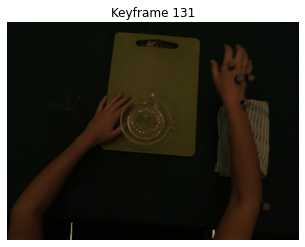

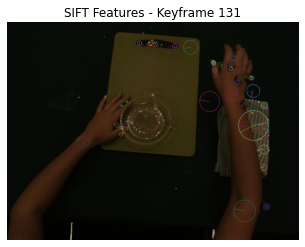

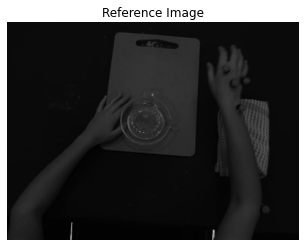

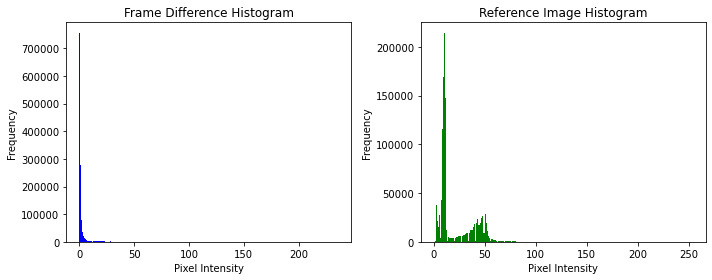

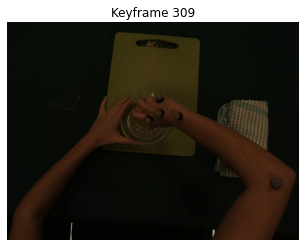

...

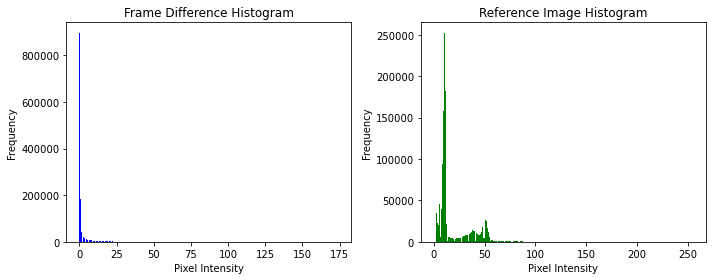

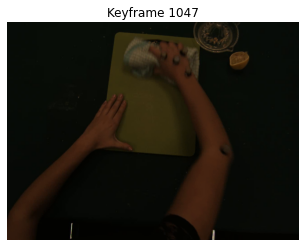

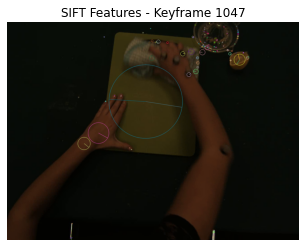

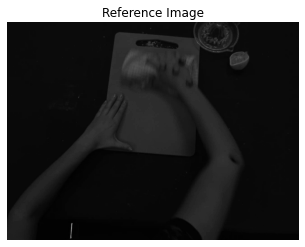

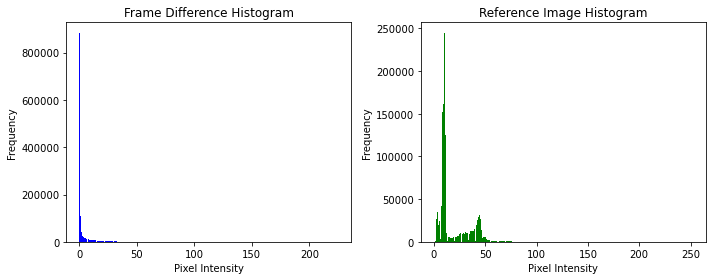

In [15]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def calculate_similarity(frame1, frame2):
    # Create SIFT object
    sift = cv2.SIFT_create()

    # Convert frames to grayscale
    frame1_gray = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
    frame2_gray = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)

    # Perform feature extraction using SIFT
    kp1, des1 = sift.detectAndCompute(frame1_gray, None)
    kp2, des2 = sift.detectAndCompute(frame2_gray, None)

    # Use a matcher to find matches between the descriptors of two frames
    matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
    matches = matcher.match(des1, des2)

    # Calculate the average distance of the matches
    avg_distance = sum(match.distance for match in matches) / len(matches)

    return avg_distance

def extract_keyframes(video_path, min_interval, a=0.2, change_threshold=10):
    cap = cv2.VideoCapture(video_path)
    frames = []

    # Create SIFT object
    sift = cv2.SIFT_create()

    # Read the first frame
    ret, prev_frame = cap.read()
    if not ret:
        return frames

    # Convert frame to grayscale
    prev_frame_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

    frame_count = 0
    action_start_frame = 0
    action_duration = 0
    is_keyframe_detected = False
    frames_since_last_keyframe = 0

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Convert frame to grayscale
        frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

        # Calculate the absolute difference between frames
        frame_diff = cv2.absdiff(frame_gray, prev_frame_gray)

        # Threshold the difference image
        _, thresh = cv2.threshold(frame_diff, 95, 255, cv2.THRESH_BINARY)

        # Count the number of white pixels in the thresholded image
        white_pixels = cv2.countNonZero(thresh)

        # If the number of white pixels exceeds a threshold, consider it a potential keyframe
        if white_pixels > 40:

            # Perform feature extraction using SIFT
            kp_curr, des_curr = sift.detectAndCompute(frame_gray, None)

            # Use a matcher to find matches between the current frame descriptors and previous keyframe descriptors
            matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_FLANNBASED)
            if len(frames) > 0:
                des_prev = frames[-1][1]
                matches = matcher.match(des_prev, des_curr)

                # If the number of matches exceeds a threshold, and the min interval has passed, consider it a keyframe
                if len(matches) > 10 and not is_keyframe_detected and frames_since_last_keyframe >= min_interval:
                    frames.append((frame, des_curr))
                    cv2.imwrite(f"keyframe_{frame_count}.jpg", frame)  # Save the keyframe as an image

                    # Visualize the keyframe with label
                    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                    plt.title(f'Keyframe {frame_count}')
                    plt.axis('off')
                    plt.show()

                    # Visualize the SIFT features with labels
                    img_kp = cv2.drawKeypoints(frame, kp_curr, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
                    plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
                    plt.title(f'SIFT Features - Keyframe {frame_count}')
                    plt.axis('off')
                    plt.show()

                    # Visualize the reference image
                    plt.imshow(prev_frame_gray, cmap='gray')
                    plt.title('Reference Image')
                    plt.axis('off')
                    plt.show()

                    # Calculate histograms
                    fig, axs = plt.subplots(1, 2, figsize=(10, 4))

                    # Plot frame difference histogram
                    axs[0].hist(frame_diff.ravel(), bins=256, color='blue')
                    axs[0].set_title('Frame Difference Histogram')
                    axs[0].set_xlabel('Pixel Intensity')
                    axs[0].set_ylabel('Frequency')

                    # Plot reference frame histogram
                    axs[1].hist(prev_frame_gray.ravel(), bins=256, color='green')
                    axs[1].set_title('Reference Image Histogram')
                    axs[1].set_xlabel('Pixel Intensity')
                    axs[1].set_ylabel('Frequency')

                    plt.tight_layout()
                    plt.show()

                    is_keyframe_detected = True
                    frames_since_last_keyframe = 0

            else:
                # If it's the first frame, consider it a keyframe
                frames.append((frame, des_curr))
                cv2.imwrite(f"keyframe_{frame_count}.jpg", frame)  # Save the keyframe as an image

                # Visualize the keyframe with label
                plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
                plt.title(f'Keyframe {frame_count}')
                plt.axis('off')
                plt.show()

                # Visualize the SIFT features with labels
                img_kp = cv2.drawKeypoints(frame, kp_curr, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
                plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
                plt.title(f'SIFT Features - Keyframe {frame_count}')
                plt.axis('off')
                plt.show()

                # Visualize the reference image
                plt.imshow(prev_frame_gray, cmap='gray')
                plt.title('Reference Image')
                plt.axis('off')
                plt.show()

                # Calculate histograms
                fig, axs = plt.subplots(1, 2, figsize=(10, 4))

                # Plot frame difference histogram
                axs[0].hist(frame_diff.ravel(), bins=256, color='blue')
                axs[0].set_title('Frame Difference Histogram')
                axs[0].set_xlabel('Pixel Intensity')
                axs[0].set_ylabel('Frequency')

                # Plot reference frame histogram
                axs[1].hist(prev_frame_gray.ravel(), bins=256, color='green')
                axs[1].set_title('Reference Image Histogram')
                axs[1].set_xlabel('Pixel Intensity')
                axs[1].set_ylabel('Frequency')

                plt.tight_layout()
                plt.show()

                is_keyframe_detected = True
                frames_since_last_keyframe = 0

        # Update the reference image if there is no change or change is smaller than the threshold
        if np.sum(frame_diff) < change_threshold:
            ref_frame = (1 - a) * prev_frame_gray.astype(float) + a * frame_gray.astype(float)
            ref_frame = ref_frame.astype(np.uint8)
        else:
            ref_frame = frame_gray

        # Update action duration and keyframe detection status
        if is_keyframe_detected:
            action_duration = 0
            is_keyframe_detected = False
        else:
            action_duration += 1

        # Check if the action duration is longer than the desired threshold
        if action_duration > 15:  # Adjust the threshold as needed
            action_duration = 0

        # Update frames since the last keyframe
        frames_since_last_keyframe += 1

        # Update previous frame and frame count
        prev_frame_gray = frame_gray
        frame_count += 1

    cap.release()
    return frames

# Example usage
video_path = r"C:\Users\Pishro System\Downloads\SCENE5_1.avi"

keyframes = extract_keyframes(video_path, min_interval=130)


## <font color="#CC0099"> References:
    
#### <font color="#660066"> Shyu, M. L., Chen, S. C., & Sarinnapakorn, K. (2003). A novel approach to key-frame extraction using color and motion features. Journal of Visual Communication and Image Representation, 14(2), 219-235.

#### <font color="#660066"> Zhou, Z., Jin, J. S., Lin, Z., Lin, Z., Lin, W., Lin, X., & Huang, T. S. (2010). Video summarization: Techniques and classification-A survey. Journal of Visual Communication and Image Representation, 21(8), 802-823.

#### <font color="#660066"> Zhang, Z., Zhou, L., & Zhang, H. J. (2012). A survey of recent advances in visual feature extraction. Multimedia Tools and Applications, 51(1), 205-226.

#### <font color="#660066"> Pang, W., Xie, L., & Zha, Z. J. (2017). Keyframe-based video summarization with a deep encoder-decoder network. In Proceedings of the IEEE International Conference on Computer Vision (pp. 2202-2210).

#### <font color="#660066"> Hua, X. S., Zhang, H. J., & Li, M. (2006). Effective key-frame extraction from MPEG videos using color information. IEEE Transactions on Circuits and Systems for Video Technology, 16(5), 620-628.
    
#### <font color="#660066">Ahmed, A., Ali, W., Akhtar, N., & Mian, A. (2020). Keyframe Extraction from Visual Data: A Review. ACM Computing Surveys (CSUR), 53(1), 1-36. doi: 10.1145/3355141
    
 #### <font color="#660066">Zhou, H., Liu, F., Sun, X., & Zhang, X. (2019). Keyframe Extraction Techniques for Action Recognition in Video Sequences: A Comprehensive Survey. IEEE Transactions on Circuits and Systems for Video Technology, 30(10), 3343-3361. doi: 10.1109/TCSVT.2019.2911044
    
    